<div align="center">
    <font color="0F5298" size="7">
        Deep Learning <br>
    </font>
    <font color="2565AE" size="5">
        CE Department <br>
        Spring 2024 - Prof. Soleymani Baghshah <br>
    </font>
    <font color="3C99D" size="5">
        HW2 Practical <br>
    </font>
    <font color="696880" size="5">
        30 Points
    </font>
</div>


In [ ]:
FULLNAME = 'Mobina'
STD_ID = 'Poulaei'

# Q3. License Plate Detection and Recognition (30 points)

## Introduction

In this assignment, we will build a two-stage license plate recognition system:

1. First stage: Detect license plates in an image (license plate detection / LPD)
2. Second stage: Recognize characters within the detected license plate (license plate recognition / LPR)

This approach is not explicitly an OCR (Optical Character Recognition), but it has some similarities with important differences. Unlike general OCR which often relies on sequence models (like RNNs or Transformers) to capture language context, license plates have a fixed format with predictable structure. This allows us to use multi-class classification or object detection models for it - first to locate plates, then to locate and classify individual characters.

## Background on YOLO (You Only Look Once)

### Evolution of Object Detection

Object detection has evolved significantly over the years:
- **Two-stage detectors** (like R-CNN family): First propose regions, then classify them
- **Single-stage detectors** (like YOLO and SSD): Predict bounding boxes and classes in a single forward pass

YOLO revolutionized object detection by framing it as a regression problem rather than a classification problem. Instead of generating region proposals and then classifying each region (a slow, two-stage process), YOLO divides the image into a grid and predicts bounding boxes and class probabilities directly in a single forward pass.

### YOLO Architecture

![YOLO Architecture](https://velog.velcdn.com/images/hunniee_j/post/cbd3888c-8b75-4325-988f-eadaded84232/image.JPG)

The basic YOLO approach:

1. **Grid Division**: Divide the image into an S×S grid
2. **Bounding Box Prediction**: Each grid cell predicts B bounding boxes, each with 5 parameters (x, y, w, h, confidence)
3. **Class Prediction**: Each grid cell also predicts class probabilities
4. **Non-Maximum Suppression**: Remove overlapping boxes with lower confidence scores

for a brief explanation of Object detection from RCNN to yolo version8 visit this [link](https://youtube.com/playlist?list=PL8VDJoEXIjppNvOzocFbRciZBrtSMi81v&si=qIh3VagQOzgWZ7Go)

the latest version of yolo is YOLO 12 and [here](https://docs.ultralytics.com/models/yolo12/) is Ultralytics documentation about it (all models of yolo family available in ultralytics has accessible documentation  [here](https://docs.ultralytics.com/models/) too.)


## Ultralytics Framework

Ultralytics is a Python library that makes it easy to train, test, and deploy YOLO models. Key features:

- **Easy to use API**: Simple Python API for training, validation, and inference
- **Pre-trained models**: Various pre-trained models of different sizes (nano to extra large)
- **Export options**: Export to various formats (ONNX, TFLite, CoreML, etc.)
- **Multi-task learning**: Support for object detection, segmentation, and pose estimation



## Assignment Tasks

In this assignment, you will:

1. Train a YOLO model for license plate detection on LPD dataset
2. Train a CNN model for license plate recognition within LPR license plates (7 digit + 1 letter classificaiton task)
3. Create an end-to-end pipeline that connects step 1 with 2
4. Evaluate the performance of your system on the test data


The dataset are available in [this](https://drive.google.com/drive/folders/1StRhbI28MaoiuXqA2rG5vGqKG5K2bMW6?usp=sharing) drive folder. let's dive into it!



In [ ]:
#Necessary installations

%pip install -q ultralytics
%pip install -q matplotlib opencv-python pyyaml

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.0/950.0 kB 35.7 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [ ]:
#imports

import os
import cv2
import yaml
import torch
import shutil
import random
import numpy as np
import pandas as pd
from PIL import Image
from tqdm import tqdm
import torch.nn as nn
import torch.optim as optim
from ultralytics import YOLO
from torchvision import models
import torch.utils.data as data
import matplotlib.pyplot as plt
from torchvision import transforms
from IPython.display import display

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [ ]:
!gdown 1tSza68O5AT4DK52UOiL6DZrnWENfourA
!unzip /kaggle/working/LPD.zip -d /kaggle/working/LPD

Downloading...
From (original): https://drive.google.com/uc?id=1tSza68O5AT4DK52UOiL6DZrnWENfourA
From (redirected): https://drive.google.com/uc?id=1tSza68O5AT4DK52UOiL6DZrnWENfourA&confirm=t&uuid=5bf7813e-7876-4b4a-970f-5963cb50a569
To: /kaggle/working/LPD.zip
100%|███████████████████████████████████████| 3.76G/3.76G [00:35<00:00, 105MB/s]
Archive:  /kaggle/working/LPD.zip
   creating: /kaggle/working/LPD/images/
  inflating: /kaggle/working/LPD/images/000001.jpg  
  inflating: /kaggle/working/LPD/images/000002.jpg  
  inflating: /kaggle/working/LPD/images/000003.jpg  
  inflating: /kaggle/working/LPD/images/000004.jpg  
  inflating: /kaggle/working/LPD/images/000005.jpg  
  inflating: /kaggle/working/LPD/images/000006.jpg  
  inflating: /kaggle/working/LPD/images/000007.jpg  
  inflating: /kaggle/working/LPD/images/000008.jpg  
  inflating: /kaggle/working/LPD/images/000009.jpg  
  inflating: /kaggle/working/LPD/images/000010.jpg  
  inflating: /kaggle/working/LPD/images/000011.jpg  


In [ ]:
! gdown 14p3KgYNCyL1kE5Vyq0j9KjfJ9CPeDgJ3
! unzip /kaggle/working/LPR.zip -d /kaggle/working/LPR

Downloading...
From (original): https://drive.google.com/uc?id=14p3KgYNCyL1kE5Vyq0j9KjfJ9CPeDgJ3
From (redirected): https://drive.google.com/uc?id=14p3KgYNCyL1kE5Vyq0j9KjfJ9CPeDgJ3&confirm=t&uuid=739be59e-fdcb-4f03-8e30-cb70415c7e47
To: /kaggle/working/LPR.zip
100%|█████████████████████████████████████████| 256M/256M [00:01<00:00, 160MB/s]
Archive:  /kaggle/working/LPR.zip
  inflating: /kaggle/working/LPR/valid_samples.csv  
   creating: /kaggle/working/LPR/detections/
  inflating: /kaggle/working/LPR/detections/1.jpg  
  inflating: /kaggle/working/LPR/detections/10.jpg  
  inflating: /kaggle/working/LPR/detections/100.jpg  
  inflating: /kaggle/working/LPR/detections/1000.jpg  
  inflating: /kaggle/working/LPR/detections/10000.jpg  
  inflating: /kaggle/working/LPR/detections/10001.jpg  
  inflating: /kaggle/working/LPR/detections/10002.jpg  
  inflating: /kaggle/working/LPR/detections/10003.jpg  
  inflating: /kaggle/working/LPR/detections/10004.jpg  
  inflating: /kaggle/working/LPR

### 1. LPD - YOLO

In [ ]:
BASE_PATH = '/kaggle/working/'
LPD_RELATIVE_PATH = 'LPD'
LPD_DIR = f'{BASE_PATH}/{LPD_RELATIVE_PATH}'

images_dir = os.path.join(LPD_DIR, 'images')
labels_dir = os.path.join(LPD_DIR, 'labels')

In [ ]:
image_files = [f for f in os.listdir(images_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]
label_files = [f for f in os.listdir(labels_dir) if f.endswith('.txt')]

print(f"Dataset contains {len(image_files)} images and {len(label_files)} labels")

objects_count = 0
for label_file in [os.path.join(labels_dir, f) for f in label_files]:
    with open(label_file, 'r') as f:
        objects_count += len(f.readlines())

print(f"Total license plates in dataset: {objects_count}")
print(f"Average plates per image: {objects_count / max(1, len(image_files)):.2f}")

Dataset contains 6252 images and 6252 labels
Total license plates in dataset: 7257
Average plates per image: 1.16




<font color="orange">
1. What is the structure of YOLO's label files (`.txt`), and why are bounding box coordinates normalized?
</font>

\
Each label file corresponds to an image and contains lines representing objects. The format of each line is:

```
<class_id> <x_center> <y_center> <width> <height>
```
class_id → The object class

x_center → Bounding box center x (normalized to image width, range 0-1).

y_center → Bounding box center y (normalized to image height, range 0-1).

width → Bounding box width (normalized to image width, range 0-1).

height → Bounding box height (normalized to image height, range 0-1).

bounding box coordinates are normalized because:
- **Scalability**: Works across different image sizes without modification.
- **Efficient Training**: The model can process images of different dimensions without re-scaling bounding box values.
- **Consistency**: Avoids errors from varying resolutions across datasets.


<font color="orange">
<br>2. How does the YAML configuration file in YOLO define a dataset, and what role does the `nc` (number of classes) parameter play?  
</font>

A YAML file in YOLO specifies dataset paths, class names, and the number of classes.

Example (data.yaml for license plate detection):

```
train: /content/dataset/train/images  # Path to training images
val: /content/dataset/val/images      # Path to validation images

nc: 1  # Number of object classes (1 class → License Plate)
names: ["license_plate"]  # Class names (index 0 corresponds to "license_plate")
```

**Role of nc (Number of Classes)**
- Defines how many object classes the model should detect.
- Affects the output layer of YOLO:
 - If nc = 1, the model predicts a single object type (e.g., license plates).
 - If nc = 80, the model predicts multiple object types (e.g., COCO dataset).

<font color="orange">
<br>3. Why does YOLO use a grid system for predictions, and how does it handle multiple objects in a single grid cell?  
</font>

YOLO use a grid system because:

- **Fast and Efficient**: Divides the image into a S×S grid (e.g., 13×13 for YOLOv3). Each grid cell predicts objects within its area.
- **Localized Predictions**: Each grid cell only predicts objects whose center falls inside it, reducing computational complexity.
- **Multi-scale Detection**: Different feature map sizes (P3, P4, P5) help detect small, medium, and large objects.



In [ ]:
# you must create a yaml file there is just one class object detection and you must split the dataset into two parts (80%-20% for train and val)
# the executed result of cell is belong to train = val = all data for better understanding about the YOLO results.

# Split train/val (80%-20%)
random.shuffle(image_files)
split_idx = int(len(image_files) * 0.8)
train_files, val_files = image_files[:split_idx], image_files[split_idx:]

# Create train/val directories
LPD_DIR = '/content/LPD'
train_img_dir = os.path.join(LPD_DIR, 'train/images')
val_img_dir = os.path.join(LPD_DIR, 'val/images')
train_lbl_dir = os.path.join(LPD_DIR, 'train/labels')
val_lbl_dir = os.path.join(LPD_DIR, 'val/labels')

for d in [train_img_dir, val_img_dir, train_lbl_dir, val_lbl_dir]:
    os.makedirs(d, exist_ok=True)

# Move files
for file in train_files:
    shutil.copy(os.path.join(images_dir, file), train_img_dir)
    shutil.copy(os.path.join(labels_dir, file.replace(file.split('.')[-1], 'txt')), train_lbl_dir)

for file in val_files:
    shutil.copy(os.path.join(images_dir, file), val_img_dir)
    shutil.copy(os.path.join(labels_dir, file.replace(file.split('.')[-1], 'txt')), val_lbl_dir)

# Create YAML file
YAML_PATH = os.path.join(LPD_DIR, 'data.yaml')
data_config = {
    'path': LPD_DIR,
    'train': 'train',
    'val': 'val',
    'nc': 1,  # Number of classes
    'names': ['license_plate']  # Class name
}

with open(YAML_PATH, 'w') as f:
    yaml.dump(data_config, f, default_flow_style=False)

YAML_PATH =  os.path.join(LPD_DIR, 'data.yaml')

In [ ]:
lpd_df = pd.read_csv('/kaggle/working/LPD/plate_labels.csv')
lpd_df_val = lpd_df[lpd_df['image_path'].isin(val_files)]
lpd_df_train = lpd_df[lpd_df['image_path'].isin(train_files)]

In [ ]:
VERSION = '12'
MODEL_SIZE = 'n'  # Options: n, s, m, l, x
EPOCHS = 10
IMGSZ = 640
BATCH = 16
DEVICE = '0'

<font color="orange">
Compare the architectural and functional advancements in YOLO versions 8 through 12. Specifically:  

1. **YOLOv8**:  
   - What was the motivation behind adopting an anchor-free design, and how did this impact training complexity and performance?
    - Anchor-based detection relies on predefined anchor boxes, which can be suboptimal for different object scales, aspect ratios, and real-world variability. Removing anchors simplifies model architecture and reduces hyperparameter tuning complexity.
   - How did the integration of CSPDarknet and PANet improve feature extraction and multi-scale detection compared to earlier versions?  
    - **CSPDarknet**: Enhances gradient flow and reduces redundancy, improving feature extraction and efficiency.
    - **PANet**: Improves multi-scale feature fusion by enhancing low-level and high-level feature integration, leading to better detection of small and large objects.
    - **Comparison to Earlier Versions**: Compared to YOLOv4/v5, these enhancements increase model efficiency, allowing for better accuracy with reduced computation.

2. **YOLOv9 (Hypothetical/Unofficial)**:  
   - If YOLOv9 introduced dynamic label assignment, how does this differ from static assignment in YOLOv8, and what are the implications for model accuracy and convergence speed?  
    - Static Assignment (YOLOv8): Predefined object-to-anchor assignment, limiting adaptability.

    - Dynamic Assignment (YOLOv9 Hypothetical): Assigns labels adaptively based on feature representations and object difficulty.

    - Implications: Faster convergence and improved accuracy due to more flexible object assignment, reducing misalignments during training.

   - What role might lightweight model variants (e.g., YOLOv9n) play in edge-device deployment, and how were they optimized for resource-constrained environments?  
    - Optimized for mobile and IoT applications where computational resources are limited. They were optimized with model pruning, quantization, knowledge distillation, and efficient backbone architectures to minimize latency while maintaining detection accuracy.


3. **YOLOv10**:  
   - How did hybrid loss functions (e.g., combining CIoU and focal loss) enhance the training process, and what challenges in object detection were they designed to address?  
    - **Enhancements**: CIoU improves localization, while focal loss mitigates class imbalance by focusing on hard-to-classify examples.
    - **Challenges Addressed**: Improves precision for small/occluded objects and prevents easy samples from dominating the loss function.

   - What advancements in model pruning and quantization were introduced, and how did these techniques reduce model size without compromising accuracy?  
    - Pruning, eliminates redundant parameters to reduce model size and quantization uses lower precision for faster inference. They reduce memory footprint and inference time without significantly impacting accuracy.

4. **YOLOv11**:  
   - In what ways did self-calibrated convolutions improve feature extraction, and how do they compare to traditional convolutional layers in terms of computational efficiency and accuracy?  
    - Self-calibrated convolutions dynamically adjusts kernel weights to enhance feature extraction. They are more adaptive than standard convolutions, which leading to better accuracy while maintaining computational efficiency.

   - How did the introduction of multi-task learning (e.g., joint object detection and segmentation) expand the capabilities of YOLOv11, and what new applications does this enable?  
    -  Joint learning for object detection and segmentation allows better contextual understanding. This applied in medical imaging, autonomous driving and aerial imagery.

5. **YOLOv12**:  
   - What benefits does the integration of transformer-based modules bring to YOLOv12, and how does this hybrid architecture balance the strengths of CNNs and transformers?  
    - Transformer-based modules enables global context awareness, overcoming CNN limitations. This hybrid architecture retain CNN efficiency while leveraging transformer capabilities for better long-range dependencies.

   - How does uncertainty estimation in YOLOv12 improve the reliability of predictions, particularly in safety-critical applications like autonomous driving or medical imaging?  
    - The uncertainty estimation helps model quantify confidence, crucial for safety-critical applications.

   - Discuss the role of domain adaptation techniques in YOLOv12 and how they address challenges like dataset bias or environmental variability.  
    -  Traditional object detection models perform poorly when tested on images from a different distribution than their training set. Changes in lighting, weather, background, or viewpoint can degrade model accuracy. Instead of labeling large amounts of data for every new domain, domain adaptation helps transfer knowledge from an existing dataset.
    - They address these challenges adversarial training, contrastive learning, and few-shot adaptation.

Based on these advancements, which version would you recommend for this aplication, and why?

</font>

In [ ]:
print(f"Starting YOLO{VERSION}{MODEL_SIZE} training for {EPOCHS} epochs...")

MODEL_PATH = os.path.join(BASE_PATH, 'yolo12n.pt')
LPD_model = YOLO(MODEL_PATH)

results = LPD_model.train(
    data=YAML_PATH,
    epochs=EPOCHS,
    imgsz=IMGSZ,
    batch=BATCH,
    name=f'yoloV{VERSION}{MODEL_SIZE}',
    optimizer='auto'
)

print("Training complete! Model saved to model/LPD folder.")

Starting YOLO12n training for 10 epochs...


100%|██████████| 5.34M/5.34M [00:00<00:00, 181MB/s]

Ultralytics 8.3.98 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)


engine/trainer: task=detect, mode=train, model=/kaggle/working/yolo12n.pt, data=/content/LPD/data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yoloV12n, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=None, format=torchscript, keras=False, optimize=F

100%|██████████| 755k/755k [00:00<00:00, 46.5MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  2    180864  ultralytics.nn.modules.block.A2C2f           [128, 128, 2, True, 4]        
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 167MB/s]


AMP: checks passed ✅


train: Scanning /content/LPD/train/labels... 5001 images, 0 backgrounds, 0 corrupt: 100%|██████████| 5001/5001 [00:04<00:00, 1191.57it/s]


train: New cache created: /content/LPD/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.5 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/LPD/val/labels... 1251 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1251/1251 [00:01<00:00, 756.14it/s]


val: New cache created: /content/LPD/val/labels.cache
Plotting labels to runs/detect/yoloV12n/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 113 weight(decay=0.0), 120 weight(decay=0.0005), 119 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/yoloV12n
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      3.43G      1.236      2.058      1.071         13        640: 100%|██████████| 313/313 [01:40<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:10<00:00,  3.86it/s]


                   all       1251       1451      0.905      0.787      0.846      0.506

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      4.28G       1.22      1.035      1.057         13        640: 100%|██████████| 313/313 [01:35<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:08<00:00,  4.69it/s]

                   all       1251       1451      0.917      0.855        0.9      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      4.28G      1.166     0.8164      1.046         11        640: 100%|██████████| 313/313 [01:33<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:08<00:00,  4.66it/s]

                   all       1251       1451      0.943      0.865       0.91       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      4.28G      1.087     0.7368      1.008         10        640: 100%|██████████| 313/313 [01:33<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:09<00:00,  4.36it/s]

                   all       1251       1451      0.929      0.885      0.923      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      4.28G      1.031     0.6456     0.9883         11        640: 100%|██████████| 313/313 [01:33<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:08<00:00,  4.49it/s]

                   all       1251       1451      0.923      0.888      0.926      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      4.28G     0.9877     0.6009     0.9692         12        640: 100%|██████████| 313/313 [01:33<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:08<00:00,  4.75it/s]

                   all       1251       1451      0.944       0.87      0.936      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      4.28G     0.9497      0.577     0.9636         10        640: 100%|██████████| 313/313 [01:33<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:08<00:00,  4.69it/s]

                   all       1251       1451      0.936      0.901      0.943      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      4.28G     0.9173     0.5417     0.9523         10        640: 100%|██████████| 313/313 [01:33<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:08<00:00,  4.71it/s]

                   all       1251       1451      0.944      0.907      0.953       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      4.28G     0.8631      0.506     0.9318          9        640: 100%|██████████| 313/313 [01:33<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:08<00:00,  4.78it/s]

                   all       1251       1451      0.924       0.91      0.949        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      4.28G     0.8452     0.4836     0.9292         11        640: 100%|██████████| 313/313 [01:33<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:09<00:00,  4.40it/s]

                   all       1251       1451      0.937      0.912      0.955      0.717



10 epochs completed in 0.290 hours.
Optimizer stripped from runs/detect/yoloV12n/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/yoloV12n/weights/best.pt, 5.5MB

Validating runs/detect/yoloV12n/weights/best.pt...
Ultralytics 8.3.98 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLOv12n summary (fused): 159 layers, 2,556,923 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 40/40 [00:09<00:00,  4.29it/s]


                   all       1251       1451      0.934      0.912      0.955      0.717


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.1ms preprocess, 2.1ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs/detect/yoloV12n
Training complete! Model saved to model/LPD folder.


Testing model on sample images...

image 1/1 /kaggle/working/LPD/images/004579.jpg: 640x384 1 license_plate, 48.8ms
Speed: 2.6ms preprocess, 48.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 384)


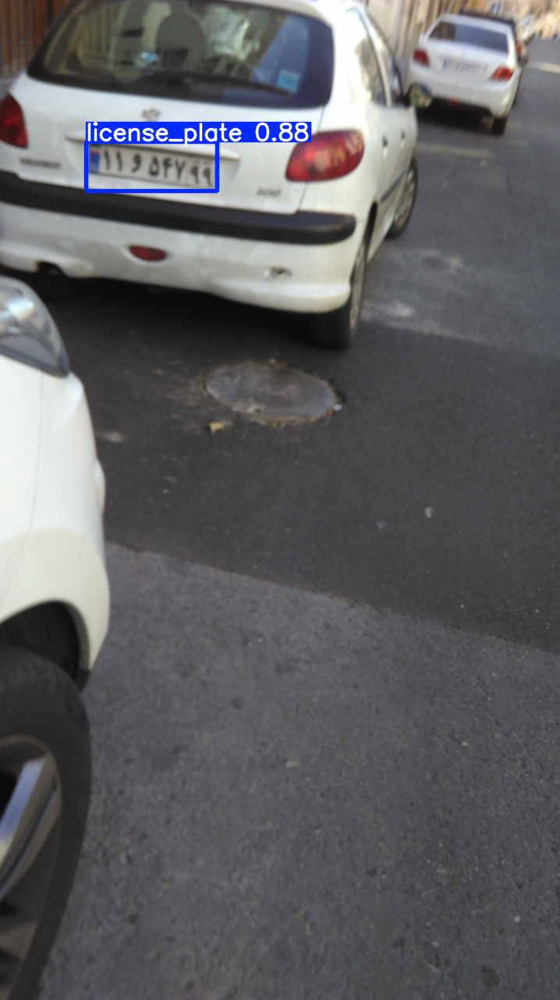


image 1/1 /kaggle/working/LPD/images/005859.jpg: 640x480 1 license_plate, 49.3ms
Speed: 2.2ms preprocess, 49.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


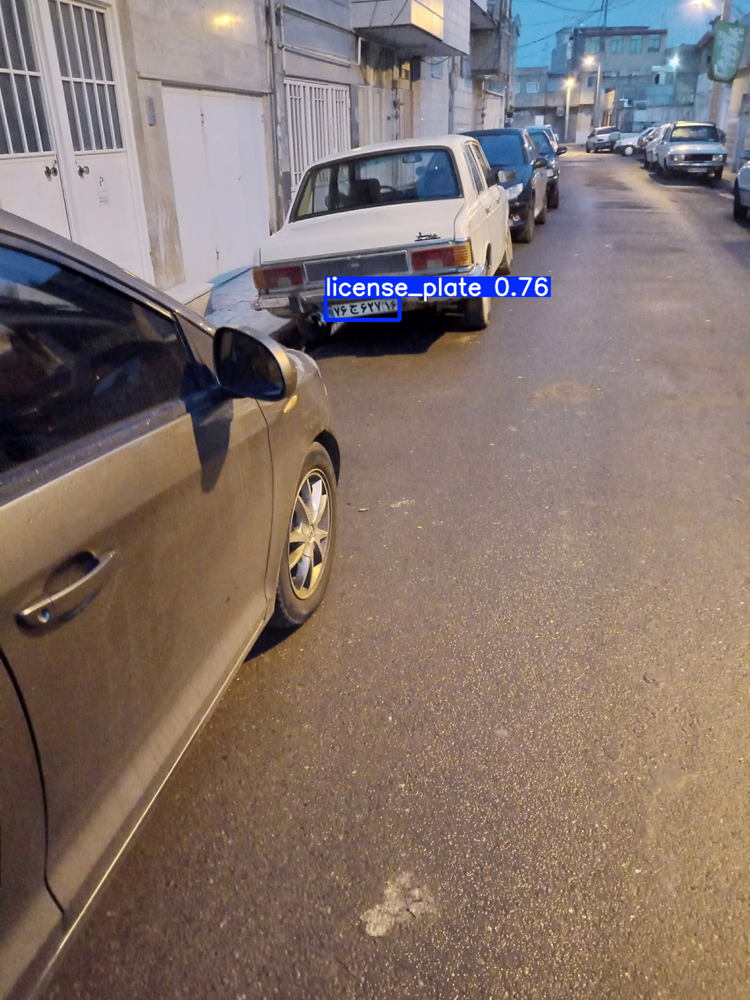


image 1/1 /kaggle/working/LPD/images/003098.jpg: 480x640 2 license_plates, 48.5ms
Speed: 2.0ms preprocess, 48.5ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


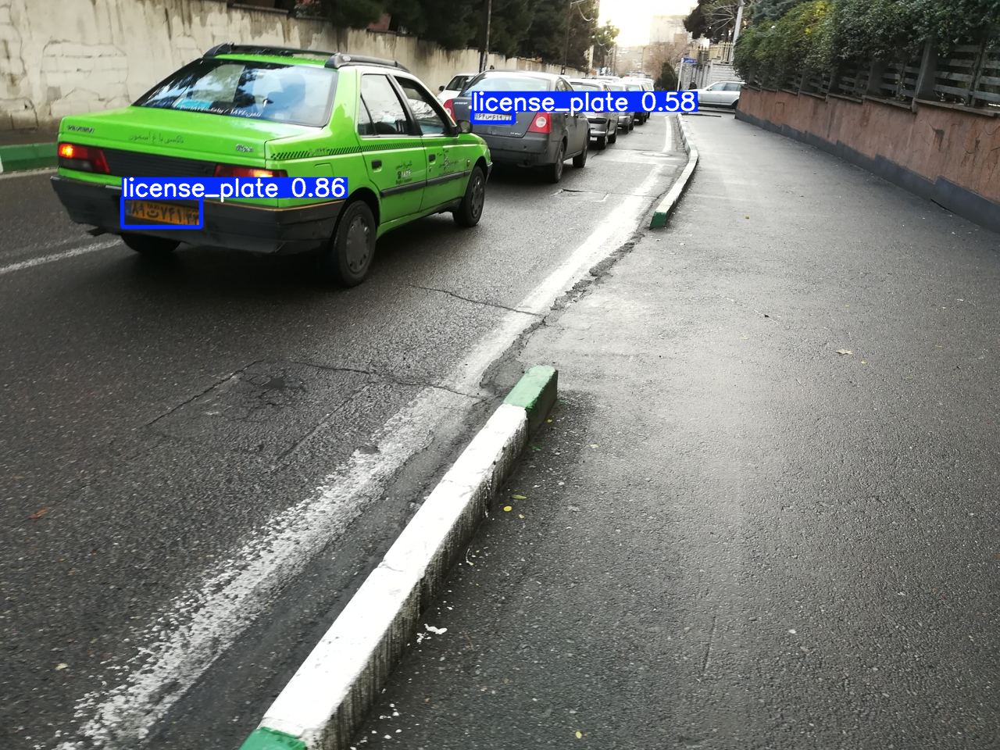


image 1/1 /kaggle/working/LPD/images/001953.jpg: 640x384 1 license_plate, 13.7ms
Speed: 1.7ms preprocess, 13.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 384)


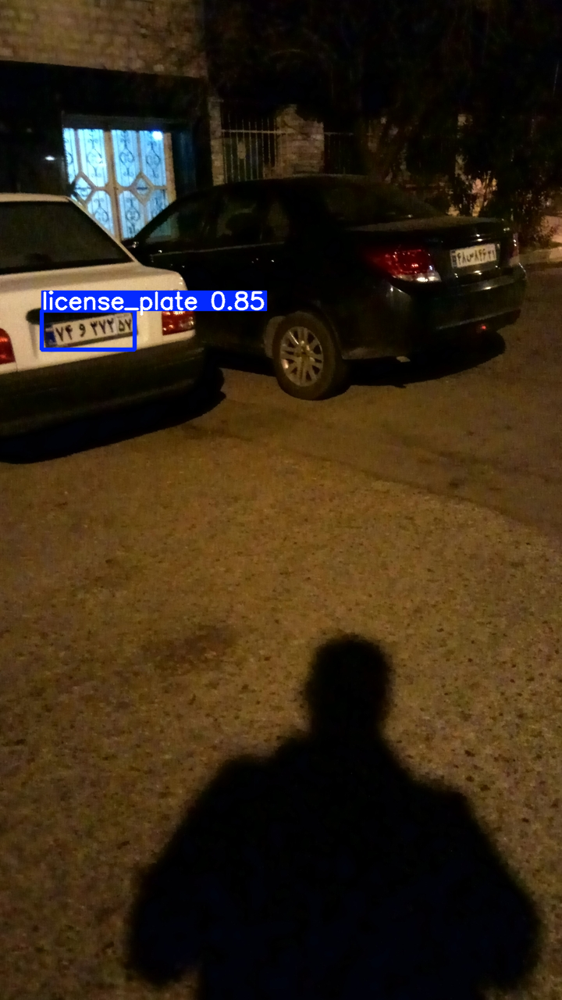


image 1/1 /kaggle/working/LPD/images/002063.jpg: 480x640 1 license_plate, 13.6ms
Speed: 2.1ms preprocess, 13.6ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


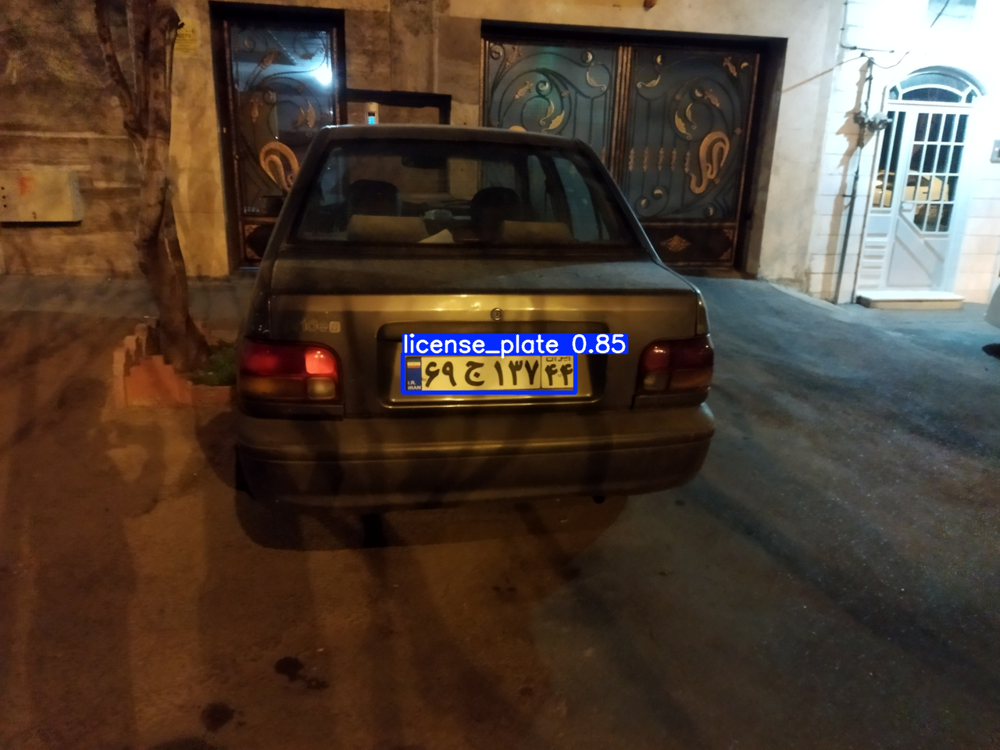

In [ ]:
%matplotlib inline

print("Testing model on sample images...")
for img_file in random.sample(image_files, 5):
    img_path = os.path.join(images_dir, img_file)
    results = LPD_model.predict(img_path, conf=0.5)
    for result in results:  # results is a list, so we iterate
        result.show()

### 2. LPR - CNN

In [ ]:
LPR_RELATIVE_PATH = 'LPR'

df = pd.read_csv(f'{BASE_PATH}/{LPR_RELATIVE_PATH}/valid_samples.csv')
df = df.sample(n=22000, random_state=42)

In [ ]:
digit_vocabulary = "0123456789"
persian_letters = "آ ب پ ت ث ج چ ح خ د ذ ر ز ژ س ش ص ض ط ظ ع غ ف ق ک گ ل م ن و ه ی".split()

digit_to_idx = {char: idx for idx, char in enumerate(digit_vocabulary)}
letter_to_idx = {char: idx for idx, char in enumerate(persian_letters)}
idx_to_digit = {idx: char for idx, char in enumerate(digit_vocabulary)}
idx_to_letter = {idx: char for idx, char in enumerate(persian_letters)}

persian_to_english_digits = {
    '۰': '0', '۱': '1', '۲': '2', '۳': '3', '۴': '4',
    '۵': '5', '۶': '6', '۷': '7', '۸': '8', '۹': '9'
}

persian_letter_normalization = {
    "الف": "آ",
    "ا" : "آ",
    "ژ (معلولین و جانبازان)": "ژ",
    "ه‍" : "ه"
}

def translate(label):

    first_two_digits = ''.join([persian_to_english_digits.get(char, char) for char in label[:2]])
    persian_letter = label[2]
    remaining_digits = ''.join([persian_to_english_digits.get(char, char) for char in label[3:]])
    return first_two_digits + persian_letter + remaining_digits

def preprocess_sample(image_path, label , full_transform=True, log=False, dir_path = BASE_PATH , relative_path= f'{LPR_RELATIVE_PATH}/detections', language='en'):

    if language == 'fa' :
      label = translate(label)

    elif language != 'en':
          raise Exception('Un-supported language!')

    path = f'{dir_path}/{relative_path}'

    train_transform = transforms.Compose([
        #todo
        transforms.Resize((224, 224)),
        transforms.ToTensor()
    ])

    test_transform = transforms.Compose([
        # todo
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
    ])


    transform = train_transform if full_transform else test_transform
    image = Image.open(f'{path}/{image_path}').convert("RGB")
    image = transform(image)

    for key, value in persian_letter_normalization.items():
        label = label.replace(key, value)

    if log:
      print(label)

      for i , c in enumerate(label):
        if c in persian_letters:
          c = '*'
        print(f"{i}:{c}", end=' | ')

      print()

    digits = [digit_to_idx[char] for char in label if char.isdigit()]
    letter = letter_to_idx[label[2]]

    return image, digits, letter

In [ ]:
class PLPRDataset(data.Dataset):
    def __init__(self, df, split='train', dir_path=BASE_PATH, relative_path = f'{LPR_RELATIVE_PATH}/detections', language='en'):
        self.df = df
        self.full_transform = True if split == 'train' else False
        self.dir_path = dir_path
        self.relative_path = relative_path
        self.language = language

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        # todo
        image_filename = self.df.iloc[idx]['image_path']
        label = self.df.iloc[idx]['label']

        image, digits, letter = preprocess_sample(image_filename,
                                                  label,
                                                  full_transform=self.full_transform,
                                                  dir_path=self.dir_path,
                                                  relative_path=self.relative_path,
                                                  language=self.language)

        return image, torch.tensor(digits, dtype=torch.long), torch.tensor(letter, dtype=torch.long)

In [ ]:
class FCNPLPRModel(nn.Module):
    def __init__(self, backbone_name="efficientnet_b0"):
        super(FCNPLPRModel, self).__init__()

        num_persian_letters=32

        # EfficientNet as the feature extractor
        self.backbone = models.__dict__[backbone_name](weights=models.EfficientNet_B0_Weights.DEFAULT)
        feature_dim = self.backbone.classifier[1].in_features
        self.backbone = nn.Sequential(*list(self.backbone.children())[:-1])

        self.flat = nn.Flatten()
        self.digit_head = nn.Linear(feature_dim, 7 * 10)  # Output shape: [batch, 70]
        self.letter_head = nn.Linear(feature_dim, num_persian_letters)  # Output shape: [batch, num_persian_letters]

    def forward(self, x):

        x = self.backbone(x)
        x = self.flat(x)

        # Digit Prediction
        digit_outputs = self.digit_head(x)
        digit_outputs = digit_outputs.view(-1, 7, 10)  # Reshape to [batch_size, 7, 10]

        # Letter Prediction
        letter_output = self.letter_head(x)  # Shape: [batch_size, num_persian_letters]

        return digit_outputs, letter_output

In [ ]:
learning_rate = 4e-4
batch_size = 32

In [ ]:
dataset = PLPRDataset(df)
dataloader = data.DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=True,
        num_workers=4,
        pin_memory=True,
        # persistent_workers=True
)

In [ ]:
LPR_model = FCNPLPRModel().to(device)
digit_criterion = nn.CrossEntropyLoss()
letter_criterion = nn.CrossEntropyLoss()

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 196MB/s]


In [ ]:
optimizer = optim.AdamW(LPR_model.parameters(), lr=learning_rate)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=2,
    threshold=0.05,
    threshold_mode='rel',
    verbose=True
)

/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


In [ ]:
def decode_predictions(digit_outputs, letter_output):
    digit_predictions = torch.argmax(digit_outputs, dim=2)  # [batch_size, 7]
    batch_size = digit_predictions.size(0)

    digits = []
    for b in range(batch_size):  # Iterate over batch
        sample_digits = []
        for i in range(7):  # Iterate over 7 digits
            try:
                sample_digits.append(idx_to_digit[digit_predictions[b][i].item()])
            except KeyError as e:
                print(f"KeyError: {e} (digit_predictions[{b}][{i}] = {digit_predictions[b][i].item()})")
                sample_digits.append("?")  # Use a placeholder for invalid indices
        digits.append(sample_digits)

    letter_prediction = torch.argmax(letter_output, dim=1)  # [batch_size]
    letters = []
    for b in range(batch_size):
        try:
            letters.append(idx_to_letter[letter_prediction[b].item()])
        except KeyError as e:
            print(f"KeyError: {e} (letter_prediction[{b}] = {letter_prediction[b].item()})")
            letters.append("?")  # Use a placeholder for invalid indices

    labels = []
    for b in range(batch_size):
        label = "".join(digits[b][:2]) + letters[b] + "".join(digits[b][2:])
        labels.append(label)

    return labels

def evaluate_misclassification(gt, pred):
    assert len(gt) == len(pred), "GT and Pred must have the same length."

    # Collect misclassified characters
    misclassified = []
    char_error_count = 0

    for i, (gt_char, pred_char) in enumerate(zip(gt, pred)):
        if gt_char != pred_char:
            misclassified.append(f"{gt_char} with {pred_char} at pos {i}")
            char_error_count += 1

    # Format the output
    misclassified_str = " , ".join(misclassified) if misclassified else "None"
    result = (f"GT: {gt} | Pred: {pred} | "
              f"Misclassified: {misclassified_str} | "
              f"Char error count: {char_error_count}")

    return result , char_error_count

def calculate_accuracy(model, df, device, dir_path=BASE_PATH, relative_path=f'{LPR_RELATIVE_PATH}/detections', language='en', log=False , cer = False):
    model.eval()
    FP= []
    CE = 0
    correct = 0
    total = 0
    with torch.no_grad():
        for _, row in tqdm(df.iterrows(), total=len(df)):
            image_path = row["image_path"]
            label = row["label"]
            try:
                image, true_digits, true_letter = preprocess_sample(image_path,
                                                                    label, full_transform=False,
                                                                    dir_path=dir_path,
                                                                    relative_path=relative_path,
                                                                    language=language)

            except Exception as e:
                print(f"Error processing {image_path}: {e}")
                continue

            true_label = "".join([digit_vocabulary[d] for d in true_digits[:2]]) \
                         + persian_letters[true_letter] \
                         + "".join([digit_vocabulary[d] for d in true_digits[2:]])
            image = image.unsqueeze(0).to(device)
            digit_outputs, letter_output = model(image)

            predicted_labels = decode_predictions(digit_outputs, letter_output)

            if predicted_labels[0] == true_label:
                correct += 1
            elif log:
                report , char_error_count = evaluate_misclassification(true_label,predicted_labels[0])
                CE += char_error_count
                FP.append(report)
            total += 1

    accuracy = correct / total * 100

    if cer:
        print(f'CER: {100* CE/(8*df.shape[0]): .4f}%')

    if log:
         for false_positive in FP:
            print(false_positive)

    return accuracy

In [ ]:
full_df = pd.read_csv(f'{BASE_PATH}/LPR/valid_samples.csv')
test_df = full_df.loc[~full_df.index.isin(df.index)]

In [ ]:
best_accuracy = 85.0
optimal_weights = None
num_epochs = 10

for epoch in range(num_epochs):
    LPR_model.train()
    total_loss = 0
    progress_bar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{num_epochs}", leave=False)

    for images, digit_targets, letter_targets in progress_bar:
        images = images.to(device)
        digit_targets = digit_targets.to(device)
        letter_targets = letter_targets.to(device)

        # Forward pass
        digit_outputs, letter_output = LPR_model(images)

        digit_loss = 0
        for i in range(7):
            digit_loss += digit_criterion(digit_outputs[:, i, :], digit_targets[:, i])
        letter_loss = letter_criterion(letter_output, letter_targets)
        loss = digit_loss + letter_loss

        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        progress_bar.set_postfix(loss=loss.item())

    avg_loss = total_loss / len(dataloader)
    print(f"Epoch {epoch+1}/{num_epochs}, Average Loss: {avg_loss:.4f}")

    LPR_model.eval()
    accuracy = calculate_accuracy(
        LPR_model,
        test_df,
        device,
        relative_path= f'{LPR_RELATIVE_PATH}/detections',
        language='en'
    )
    print(f"Accuracy after Epoch {epoch+1}: {accuracy:.2f}%")

    scheduler.step(accuracy)

    if accuracy > best_accuracy:
        best_accuracy = accuracy
        optimal_weights = LPR_model.state_dict()  # Save the current model weights
        print(f"New best accuracy: {best_accuracy:.2f}%. Saving model weights.")
        torch.save(LPR_model.state_dict(), f'{BASE_PATH}/PLPR-CNN.pth')

if optimal_weights is not None:
    LPR_model.load_state_dict(optimal_weights)
    print("Loaded optimal weights into the model.")

Epoch 1/10, Average Loss: 6.8679


100%|██████████| 2561/2561 [00:29<00:00, 86.85it/s]


Accuracy after Epoch 1: 83.87%


Epoch 2/10, Average Loss: 0.8759


100%|██████████| 2561/2561 [00:29<00:00, 88.15it/s]


Accuracy after Epoch 2: 90.32%
New best accuracy: 90.32%. Saving model weights.


Epoch 3/10, Average Loss: 0.5125


100%|██████████| 2561/2561 [00:29<00:00, 87.98it/s]


Accuracy after Epoch 3: 91.92%
New best accuracy: 91.92%. Saving model weights.


Epoch 4/10, Average Loss: 0.3894


100%|██████████| 2561/2561 [00:29<00:00, 87.85it/s]


Accuracy after Epoch 4: 91.37%


Epoch 5/10, Average Loss: 0.2103


100%|██████████| 2561/2561 [00:29<00:00, 85.83it/s]


Accuracy after Epoch 5: 93.05%
New best accuracy: 93.05%. Saving model weights.


Epoch 6/10, Average Loss: 0.1478


100%|██████████| 2561/2561 [00:29<00:00, 87.13it/s]


Accuracy after Epoch 6: 92.93%


Epoch 7/10, Average Loss: 0.1187


100%|██████████| 2561/2561 [00:29<00:00, 86.97it/s]


Accuracy after Epoch 7: 92.70%


Epoch 8/10, Average Loss: 0.0776


100%|██████████| 2561/2561 [00:29<00:00, 86.61it/s]


Accuracy after Epoch 8: 92.93%


Epoch 9/10, Average Loss: 0.0551


100%|██████████| 2561/2561 [00:29<00:00, 86.82it/s]


Accuracy after Epoch 9: 93.24%
New best accuracy: 93.24%. Saving model weights.


Epoch 10/10, Average Loss: 0.0475


100%|██████████| 2561/2561 [00:29<00:00, 86.57it/s]

Accuracy after Epoch 10: 93.05%
Loaded optimal weights into the model.


In [ ]:
# Calculate accuracy
accuracy = calculate_accuracy(LPR_model, test_df, device, cer=True, log=True)
print(f"Accuracy: {accuracy:.2f}%")

100%|██████████| 2561/2561 [00:29<00:00, 87.14it/s]

CER:  1.1812%
GT: 57ژ46711 | Pred: 57ع46711 | Misclassified: ژ with ع at pos 2 | Char error count: 1
GT: 81ع27744 | Pred: 81ع37744 | Misclassified: 2 with 3 at pos 3 | Char error count: 1
GT: 52ع35813 | Pred: 52ع35812 | Misclassified: 3 with 2 at pos 7 | Char error count: 1
GT: 45ت87733 | Pred: 45ت87742 | Misclassified: 3 with 4 at pos 6 , 3 with 2 at pos 7 | Char error count: 2
GT: 91ی36388 | Pred: 61ی36388 | Misclassified: 9 with 6 at pos 0 | Char error count: 1
GT: 74ه62255 | Pred: 74ه62455 | Misclassified: 2 with 4 at pos 5 | Char error count: 1
GT: 87ه59611 | Pred: 83ه69611 | Misclassified: 7 with 3 at pos 1 , 5 with 6 at pos 3 | Char error count: 2
GT: 64ه65878 | Pred: 64ه65888 | Misclassified: 7 with 8 at pos 6 | Char error count: 1
GT: 42ن93839 | Pred: 42ن94839 | Misclassified: 3 with 4 at pos 4 | Char error count: 1
GT: 16ن61233 | Pred: 16ن61222 | Misclassified: 3 with 2 at pos 6 , 3 with 2 at pos 7 | Char error count: 2
GT: 59ن95228 | Pred: 59ن95238 | Misclassified: 2 with 3 

### 3. E2E LPDR

load the models from part 2 and 3, build a class named E2E_LPDR and plot report the metrics (accuracy and cer) for the test dataset (20% of LPD that has Splitted in section 1 ). you must also plot some samples with predicted bounding box and label too.


note that each picture might have multiple plates but in this test data for simplicity all samples just have a single plate exists in it.
plot some samples from your pipeline (predicted bb from an image + predicted label of it)


In [ ]:
class E2E_LPDR:
    def __init__(self, detection_model_path, recognition_model_path, device='cuda'):
        self.device = device

        # Load detection model (YOLO)
        self.detector = YOLO("runs/detect/yoloV12n/weights/best.pt")
        self.detector.eval()

        # Load recognition model (CNN)
        self.recognizer = FCNPLPRModel().to(self.device)
        self.recognizer.load_state_dict(torch.load(recognition_model_path, map_location=self.device))
        self.recognizer.eval()

        # Image transformations for the recognition model
        self.transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor()
        ])

    def detect_plate(self, image):
        results = self.detector.predict(image, verbose=False)
        if len(results) > 0 and len(results[0].boxes) > 0:
            box = results[0].boxes[0].xyxy[0].cpu().numpy()  # Take the first detection (single plate assumption)
            return box
        return None

    def recognize_plate(self, cropped_plate):
        image = Image.fromarray(cropped_plate)
        image = self.transform(image).unsqueeze(0).to(self.device)

        with torch.no_grad():
            digit_outputs, letter_output = self.recognizer(image)

        predicted_label = decode_predictions(digit_outputs, letter_output)[0]
        return predicted_label

    def process_image(self, image_path):
        image_path = f'{BASE_PATH}/{LPD_RELATIVE_PATH}/images/{image_path}'

        # Load image
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Detect plate
        box = self.detect_plate(image)  # [x_min, y_min, x_max, y_max]

        if box is None:
            return None, None, None

        x_min, y_min, x_max, y_max = map(int, box)

        # Crop the license plate
        cropped_plate = image[y_min:y_max, x_min:x_max]

        # Recognize the plate
        predicted_label = self.recognize_plate(cropped_plate)

        return image, box, predicted_label

    def evaluate(self, df):
        correct, total, char_errors = 0, 0, 0

        for _, row in df.iterrows():
            image_path = row['image_path']
            true_label = row['label'].split()[0]

            translated_label = translate(true_label)

            image, box, pred_label = self.process_image(image_path)

            if pred_label is None:
                continue

            misclassification_report, char_error_count = evaluate_misclassification(translated_label, pred_label)
            print(misclassification_report)
            char_errors += char_error_count

            if pred_label == true_label:
                correct += 1

            total += 1

        accuracy = correct / total * 100
        cer = 100 * char_errors / (8 * total)

        print(f"Accuracy: {accuracy:.2f}%")
        print(f"Character Error Rate (CER): {cer:.2f}%")


    def plot_samples(self, df, num_samples=5):

        sample_images = df.sample(n=num_samples)
        fig, axes = plt.subplots(1, len(sample_images), figsize=(15, 5))

        for i, (_, row) in enumerate(sample_images.iterrows()):
            image_path = row['image_path']
            image, box, pred_label = self.process_image(image_path)

            if image is None or box is None:
                continue

            x_min, y_min, x_max, y_max = map(int, box)

            image_with_box = image.copy()
            cv2.rectangle(image_with_box, (x_min, y_min), (x_max, y_max), (0, 0, 255), 2)

            label_text = pred_label if pred_label else "Unknown"
            cv2.putText(image_with_box, label_text, (x_min, y_min - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 255), 2)

            ax = axes[i] if len(sample_images) > 1 else axes
            ax.imshow(image_with_box)
            ax.axis("off")
            ax.set_title(f"Predicted: {label_text}")

        plt.tight_layout()
        plt.show()

In [ ]:
# Load the models and evaluate on test data
e2e_lpdr = E2E_LPDR(detection_model_path='/kaggle/working/yolo12n.pt',
                    recognition_model_path=f'{BASE_PATH}/PLPR-CNN.pth')

In [ ]:
e2e_lpdr.evaluate(lpd_df_val)

GT: 48و15116 | Pred: 48و15116 | Misclassified: None | Char error count: 0
GT: 35و33669 | Pred: 35و33669 | Misclassified: None | Char error count: 0
GT: 21د38988 | Pred: 21د38988 | Misclassified: None | Char error count: 0
GT: 77ق12233 | Pred: 77ق12233 | Misclassified: None | Char error count: 0
GT: 73ع14168 | Pred: 73ع14168 | Misclassified: None | Char error count: 0
GT: 46ق88138 | Pred: 46ق88138 | Misclassified: None | Char error count: 0
GT: 81ه99563 | Pred: 81ه99563 | Misclassified: None | Char error count: 0
GT: 25و25477 | Pred: 25و25477 | Misclassified: None | Char error count: 0
GT: 78ط37288 | Pred: 78ط37288 | Misclassified: None | Char error count: 0
GT: 35ط67147 | Pred: 35ط67147 | Misclassified: None | Char error count: 0
GT: 55ص93863 | Pred: 55ص93863 | Misclassified: None | Char error count: 0
GT: 58ق78663 | Pred: 58ق78663 | Misclassified: None | Char error count: 0
GT: 27ل98699 | Pred: 27ل98699 | Misclassified: None | Char error count: 0
GT: 18م73283 | Pred: 18م73283 | Miscla

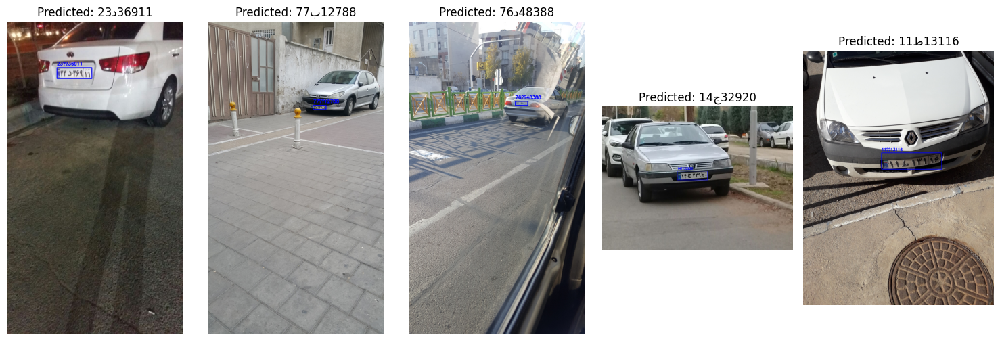

In [ ]:
e2e_lpdr.plot_samples(lpd_df_val)